# PLOTS

#### The purpose of this Notebook is to collect all useful plots of the data in the same place 
#### (The data is generated and then saved as .csv's in ALL_data_preprocessing_FINAL VERSION.ipynb)

In [1]:
import numpy as np
import pandas as pd
import datetime as dt
from dateutil import relativedelta
import time
import matplotlib.pyplot as plt
import matplotlib
plt.set_cmap('bone')
import seaborn as sns
from geopy import distance
from sklearn.cluster import DBSCAN
import time
import re
import folium
from matplotlib.ticker import MaxNLocator
from tqdm.notebook import tqdm
from IPython.display import display
import scipy
from sklearn.preprocessing import StandardScaler
import scipy.stats
import math

cmap = plt.cm.bone
import warnings
warnings.filterwarnings('ignore')

<Figure size 432x288 with 0 Axes>

### Date of last data: 

In [2]:
lastdata = '11052021'

In [3]:
df = pd.read_csv('df_' + lastdata + '.csv')
df = df.drop(columns = 'Unnamed: 0')
df['Start Date'] = pd.to_datetime(df['Start Date'])
df['End Date'] = pd.to_datetime(df['End Date'])

df.head(1)

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,CenterLat,CenterLon
0,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-29 20:17:00,2011-07-29 23:20:00,183.533333,114.05,6.249457,2,J1772,37.444572,-122.160309,0.0,2,37.444544,-122.160258


In [4]:
df2 = df.copy() 



In [5]:
plugdf = pd.read_csv('plugdf_' + lastdata + '.csv')
plugdf = plugdf.rename(columns = {'Unnamed: 0': 'Date'})
plugdf['Date'] = pd.to_datetime(plugdf['Date'])
plugdf = plugdf.set_index('Date')
#p2 = p2.drop(columns = 'Unnamed: 0')
plugdf.head()

,Label,Plugs_raw,Number of NEMA 5-20R_raw,Plugs,Number of NEMA 5-20R
Date,,,,,
2011-10-10,0,2.0,1.0,2.0,1.0
2011-10-11,0,2.0,1.0,2.0,1.0
2011-10-12,0,2.0,1.0,2.0,1.0
2011-10-13,0,4.0,2.0,4.0,2.0
2011-10-14,0,4.0,2.0,4.0,2.0


In [6]:
dfPOI = pd.read_csv('dfPOI_' + lastdata + '.csv')
dfPOI.head()

,Unnamed: 0,Name,Latitude,Longitude,Category,Sub Category,Label0_Lat,Label0_Lon,Label1_Lat,Label1_Lon,...,Label7_Lon,0_Distance,1_Distance,2_Distance,3_Distance,4_Distance,5_Distance,6_Distance,7_Distance,CatCode
0,0,Zydeco Party,37.452546,-122.112660,Arts & Entertainment,Music Venue,37.446603,-122.162217,37.426246,-122.146024,...,-122.15817,4434.338396,4151.893294,4304.376051,4568.959618,3376.795700,2449.890286,3862.166807,4052.862614,0
1,1,Delta Chi Alumni,37.450602,-122.114825,College & University,Fraternity House,37.446603,-122.162217,37.426246,-122.146024,...,-122.15817,4216.913470,3864.025306,4076.071471,4337.663813,3163.248927,2204.136774,3574.609609,3843.037035,1
2,2,Phi Beta Pi Alumni,37.452672,-122.113965,College & University,Fraternity House,37.446603,-122.162217,37.426246,-122.146024,...,-122.15817,4322.338200,4080.610391,4194.436547,4459.618699,3390.703609,2345.463209,3789.698704,3939.798565,1
3,3,Delta Delta Delta Alumni,37.450842,-122.114379,College & University,Fraternity House,37.446603,-122.162217,37.426246,-122.146024,...,-122.15817,4259.012864,3910.897697,4119.432357,4381.384462,3188.524719,2249.179524,3621.605130,3884.165348,1
4,4,Mama's Taco Wagon,37.450386,-122.116925,Food,Food Truck,37.446603,-122.162217,37.426246,-122.146024,...,-122.15817,4029.609738,3716.173257,3888.851219,4150.615346,3152.565828,2018.549637,3425.133861,3656.103450,3


In [7]:
df_days_with_external = pd.read_csv('df_days_with_external_' + lastdata + '.csv')
df_days_with_external = df_days_with_external.set_index('Date')


df_days_with_external.head(1)

,Label,Charging Time (mins),Parking Time (mins),Energy (kWh),Fee (USD),# Food,# Shop & Service,# Professional & Other Places,# Nightlife Spot,# Outdoors & Recreation,...,Year_Month_6,Year_Month_7,Year_Month_8,Year_Month_9,Year_Month_10,Year_Month_11,Year_Month_12,Holiday,Days_previous_holiday,Days_next_holiday
Date,,,,,,,,,,,,,,,,,,,,,
2011-07-29,2,114.05,183.533333,6.249457,0.0,127.0,99.0,86,87.0,82,...,0,1,0,0,0,0,0,0,25,38


In [8]:
df3 = df_days_with_external.copy() 
df3.columns

Index(['Label', 'Charging Time (mins)', 'Parking Time (mins)', 'Energy (kWh)',
       'Fee (USD)', '# Food', '# Shop & Service',
       '# Professional & Other Places', '# Nightlife Spot',
       '# Outdoors & Recreation', '# Arts & Entertainment',
       '# Travel & Transport', '# College & University', '# Event',
       '# Residence', 'Plugs_raw', 'Number of NEMA 5-20R_raw', 'Plugs',
       'Number of NEMA 5-20R', 'Label_0', 'Label_1', 'Label_2', 'Label_3',
       'Label_4', 'Label_5', 'Label_6', 'Label_7', 'Month_Day_1',
       'Month_Day_2', 'Month_Day_3', 'Month_Day_4', 'Month_Day_5',
       'Month_Day_6', 'Month_Day_7', 'Month_Day_8', 'Month_Day_9',
       'Month_Day_10', 'Month_Day_11', 'Month_Day_12', 'Month_Day_13',
       'Month_Day_14', 'Month_Day_15', 'Month_Day_16', 'Month_Day_17',
       'Month_Day_18', 'Month_Day_19', 'Month_Day_20', 'Month_Day_21',
       'Month_Day_22', 'Month_Day_23', 'Month_Day_24', 'Month_Day_25',
       'Month_Day_26', 'Month_Day_27', 'Month_Day_28

In [9]:
def get_until_not_zero(df):

    index = df[df["Energy (kWh)"] != 0].index[0]

    df = df.loc[index:]

    return df

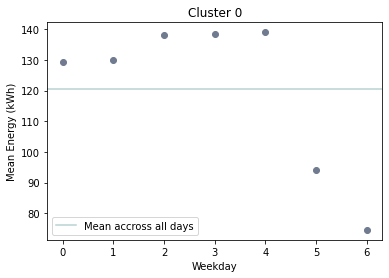

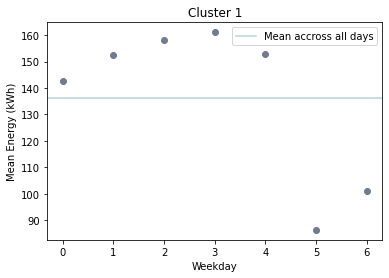

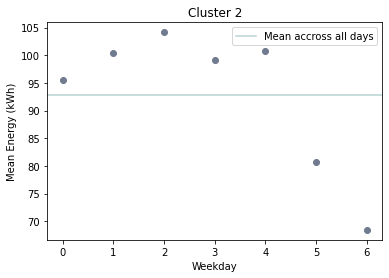

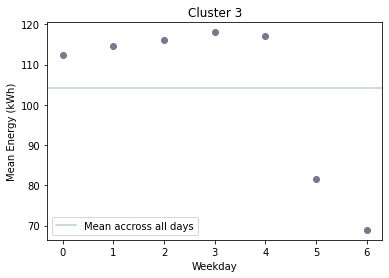

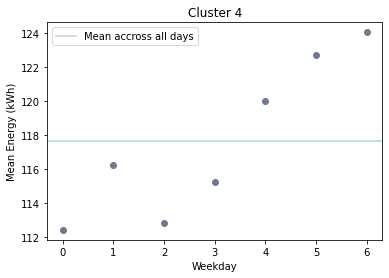

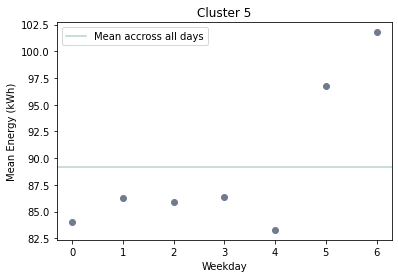

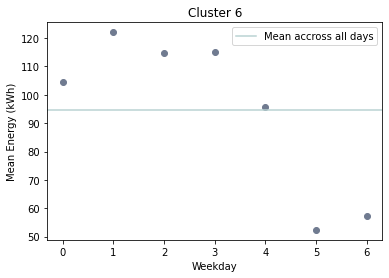

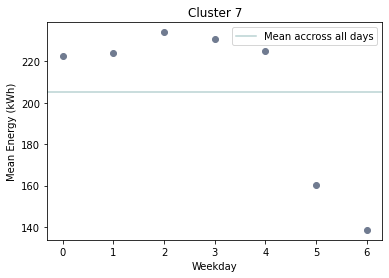

In [10]:
#d = {}
for c in range(8): 
    days = []
    for d in range(7): 
        dftemp = df3[(df3[f'Week_Day_{d}'] == 1) & (df3[f'Label_{c}'] == 1)]
        dftemp = get_until_not_zero(dftemp)
        mean = dftemp['Energy (kWh)'].mean() 
        sd = dftemp['Energy (kWh)'].std()
        days.append(mean)
        
        plt.scatter(d, mean, color = cmap(0.5))
        #plt.errorbar(d, mean, sd, linestyle='None', marker='^')
        plt.ylabel('Mean Energy (kWh)')
        plt.xlabel('Weekday')
        plt.title(f"Cluster {c}")
    plt.axhline(y = np.mean(days), color = cmap(0.8), label = 'Mean accross all days')
    plt.legend()
    plt.show()
 

## Does POIs contribute at all? 

In [11]:
df4 = df_days_with_external.copy() 
df4 = df4.fillna(0)

In [12]:
df4.head()

,Label,Charging Time (mins),Parking Time (mins),Energy (kWh),Fee (USD),# Food,# Shop & Service,# Professional & Other Places,# Nightlife Spot,# Outdoors & Recreation,...,Year_Month_6,Year_Month_7,Year_Month_8,Year_Month_9,Year_Month_10,Year_Month_11,Year_Month_12,Holiday,Days_previous_holiday,Days_next_holiday
Date,,,,,,,,,,,,,,,,,,,,,
2011-07-29,2,114.050000,183.533333,6.249457,0.0,127.0,99.0,86,87.0,82,...,0,1,0,0,0,0,0,0,25,38
2011-07-30,2,517.200000,686.650000,28.978653,0.0,127.0,99.0,86,87.0,82,...,0,1,0,0,0,0,0,0,26,37
2011-07-31,2,647.866667,725.983333,37.209163,0.0,127.0,99.0,86,87.0,82,...,0,1,0,0,0,0,0,0,27,36
2011-08-01,2,95.133333,203.566667,5.041244,0.0,127.0,99.0,86,87.0,82,...,0,0,1,0,0,0,0,0,28,35
2011-08-02,2,279.983333,280.316667,16.210423,0.0,127.0,99.0,86,87.0,82,...,0,0,1,0,0,0,0,0,29,34


In [13]:
df4.columns[5:15]

Index(['# Food', '# Shop & Service', '# Professional & Other Places',
       '# Nightlife Spot', '# Outdoors & Recreation', '# Arts & Entertainment',
       '# Travel & Transport', '# College & University', '# Event',
       '# Residence'],
      dtype='object')

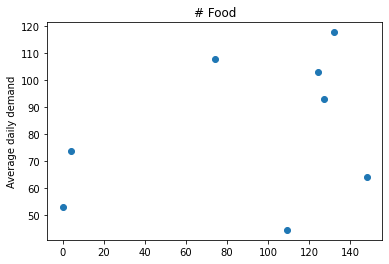

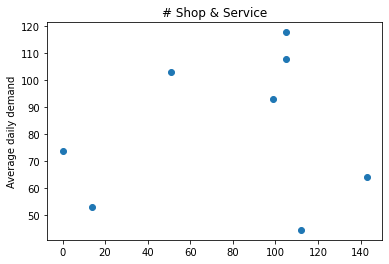

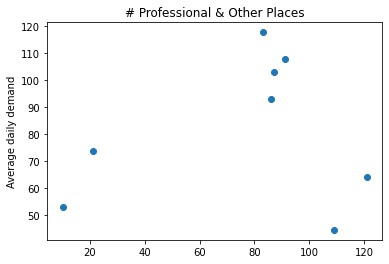

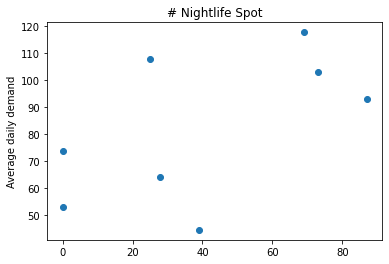

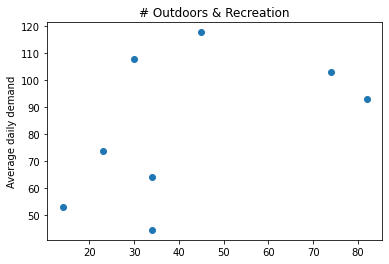

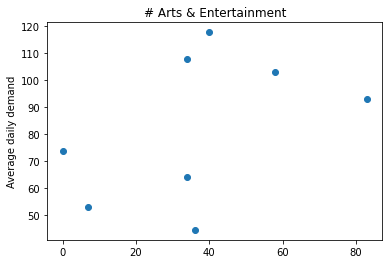

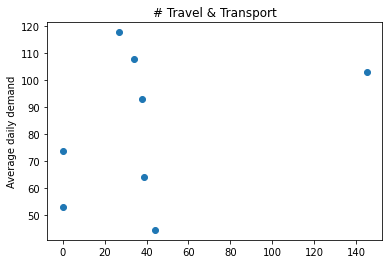

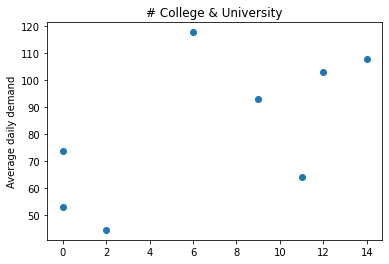

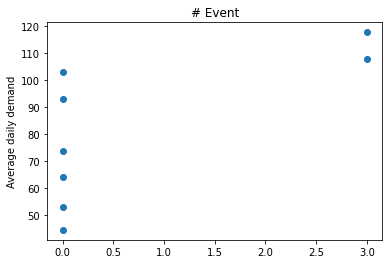

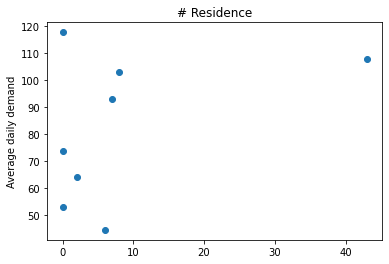

In [14]:
clmeans = []

for l in np.sort(list(df4['Label'].unique())): 
    dfcl = df4[df4['Label'] == l]
    clmean = dfcl['Energy (kWh)'].mean()
    clmeans.append(clmean)
    

for p in list(df4.columns[5:15]):
    POIs = []
    for l2 in np.sort(list(df4['Label'].unique())):
        dfcl2 = df4[df4['Label'] == l2]
        POI = dfcl2[p][0]
        POIs.append(POI)
     
    #print(POIs)
    plt.scatter(POIs, clmeans)
    plt.title(p)
    plt.ylabel('Average daily demand')
    plt.show()

## Distribution of Energy (kWh) 

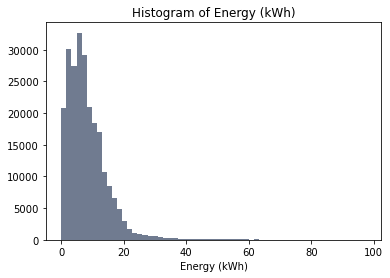

In [15]:
plt.hist(df['Energy (kWh)'], bins = 60, color = cmap(0.5))
plt.title('Histogram of Energy (kWh)')
plt.xlabel('Energy (kWh)')
plt.show()

## Plug type

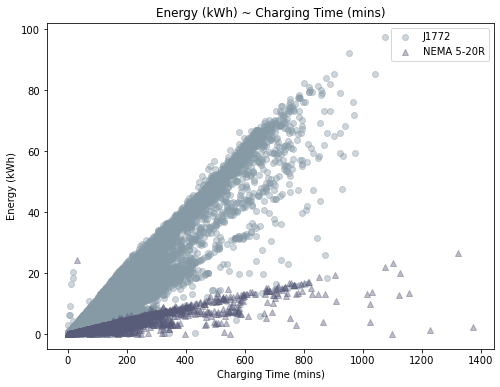

In [16]:
plt.figure(figsize=(8,6))
plt.scatter(df[df['Plug Type'] == 'J1772']['Charging Time (mins)'], df[df['Plug Type'] == 'J1772']['Energy (kWh)'], color = cmap(0.6), alpha = 0.4, label = 'J1772', marker = 'o')
plt.scatter(df[df['Plug Type'] == 'NEMA 5-20R']['Charging Time (mins)'], df[df['Plug Type'] == 'NEMA 5-20R']['Energy (kWh)'], color = cmap(0.4), alpha = 0.4, label = 'NEMA 5-20R', marker = "^")
plt.legend() 
plt.title('Energy (kWh) ~ Charging Time (mins)')
plt.ylabel('Energy (kWh)')
plt.xlabel('Charging Time (mins)')


plt.show()

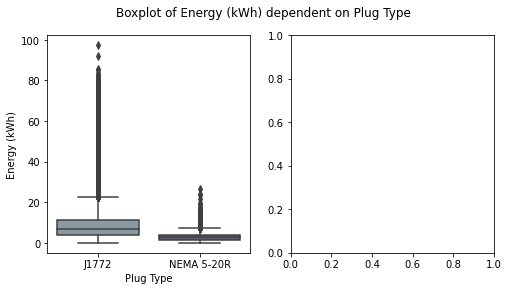

In [52]:
fig, axes = plt.subplots(1,2, figsize=(8,4)) #, dpi= 100
my_pal = {"J1772": cmap(0.6), "NEMA 5-20R": cmap(0.4)}

sns1 = sns.boxplot(x='Plug Type', y='Energy (kWh)', data = df, ax=axes[0], palette = my_pal)

#sns2 = sns.boxplot(x='Plug Type', y='Energy (kWh)', data = df, palette = my_pal)
#sns2.axis((x1,x2,0,25))
fig.suptitle('Boxplot of Energy (kWh) dependent on Plug Type')
plt.show()

TypeError: 'AxesSubplot' object is not subscriptable

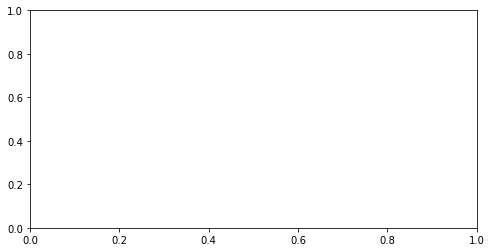

In [55]:
fig, axes = plt.subplots(1,1, figsize=(8,4)) #, dpi= 100
#plt.figure(figsize=(8,6))

my_pal = {"J1772": cmap(0.6), "NEMA 5-20R": cmap(0.4)}

sns1 = sns.boxplot(x='Plug Type', y='Energy (kWh)', data = df, ax=axes[0], palette = my_pal)

#sns2 = sns.boxplot(x='Plug Type', y='Energy (kWh)', data = df, palette = my_pal)
#sns2.axis((x1,x2,0,25))
fig.suptitle('Boxplot of Energy (kWh) dependent on Plug Type')
plt.show()

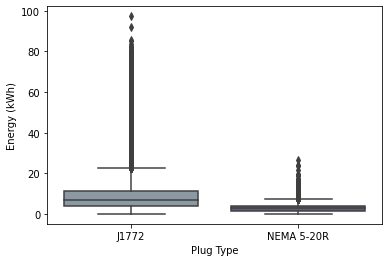

In [18]:
my_pal = {"J1772": cmap(0.6), "NEMA 5-20R": cmap(0.4)}

sns.boxplot(x='Plug Type', y='Energy (kWh)', data = df, palette = my_pal)
plt.show()

## Clusters 

In [18]:
m0 = folium.Map(location=[37.435, -122.14], tiles="Stamen Toner", zoom_start=14)
m0

In [60]:
m = folium.Map(location=[37.435, -122.14], tiles="Stamen Toner", zoom_start=14)

In [61]:
#colors = ['red','blue','gray','orange','black','green','purple', 'yellow', 'cyan']
#colors = ['red', 'orange', 'yellow', 'green', 'cyan', 'blue', 'purple', 'black']
colors = ['red', 'orange', 'gray', 'green', 'darkblue', 'blue', 'purple', 'black', 'darkgreen']

#colors = []
#for i in range(8):
#    frac = (i+1)*(1/8)
#    c = plt.cm.bone(frac)
#    colors.append(c)
#

#cols = dict(zip(groups,colors))

labels = df['Label'].unique()
for label in labels: 
    centerlat = df[df['Label'] == label]['CenterLat'].min()
    centerlon = df[df['Label'] == label]['CenterLon'].min()
    
    folium.Circle(radius = 5, fill = True, fill_opacity=1,
                  location = [centerlat, centerlon],
                  color = colors[label]).add_to(m)
    if label == 2:
        folium.Marker(location = [centerlat + 0.01 /8, centerlon + 0.0024], icon=DivIcon(
            icon_size=(150,36),
            icon_anchor=(7,20),
            html=f'<div style="font-size: 18pt; color : {colors[label]}">{label}</div>',
            )).add_to(m)
        
    elif label == 4: 
        folium.Marker(location = [centerlat + 0.01 /4, centerlon + 0.0026], icon=DivIcon(
            icon_size=(150,36),
            icon_anchor=(7,20),
            html=f'<div style="font-size: 18pt; color : {colors[label]}">{label}</div>',
            )).add_to(m)

    else: 
        folium.Marker(location = [centerlat + 0.01 /4, centerlon - 0.0017], icon=DivIcon(
            icon_size=(150,36),
            icon_anchor=(7,20),
            html=f'<div style="font-size: 18pt; color : {colors[label]}">{label}</div>',
            )).add_to(m)        

macs = df['MAC Address'].unique()
for mac in macs: 
    maclat = df[df['MAC Address'] == mac]['Latitude'].min()
    maclon = df[df['MAC Address'] == mac]['Longitude'].min()
    maclabel = df[df['MAC Address'] == mac]['Label'].min()
    macstationname = df[df['MAC Address'] == mac]['Station Name'].min()
    #folium.Circle(radius = 25, fill = True, fill_opacity=0.7,
    #              location = [maclat, maclon],
    #              color = colors[maclabel]).add_to(m)
    
    folium.Marker(icon=folium.Icon(color=colors[maclabel], icon='plug', prefix='fa'),
                  location = [maclat, maclon], popup= f"Station Name: {macstationname}\nLabel: {maclabel}"
                  ).add_to(m)
    
    
     
    
    


    

In [62]:
m

## Folium plot with POIs

In [77]:
dfPOI[['Category', 'CatCode']].drop_duplicates().sort_values('CatCode')

,Category,CatCode
0,Arts & Entertainment,0
1,College & University,1
846,Event,2
4,Food,3
232,Nightlife Spot,4
7,Outdoors & Recreation,5
15,Professional & Other Places,6
407,Residence,7
53,Shop & Service,8
63,Travel & Transport,9


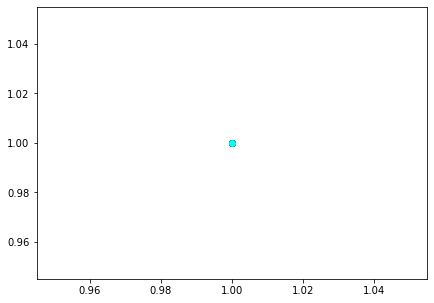

<Figure size 504x360 with 0 Axes>

In [149]:
import numpy as np
from matplotlib import pyplot as plt
x = np.linspace(1, 100, 1000)
y = np.log(x)
y1 = np.sin(x)
fig = plt.figure("Line plot")
legendFig = plt.figure("Legend plot")
ax = fig.add_subplot(111)


cats = list(dfPOI[['Category', 'CatCode']].drop_duplicates().sort_values('CatCode')['Category'])
colors = ['red','blue','yellow','orange','black','green','purple', 'lightgreen', 'black', 'cyan']

zero = ax.scatter(1,1, c=colors[0], label = cats[0]) 
one = ax.scatter(1,1, c=colors[1], label = cats[1]) 
two = ax.scatter(1,1, c=colors[2], label = cats[2]) 
three = ax.scatter(1,1, c=colors[3], label = cats[3]) 
four = ax.scatter(1,1, c=colors[4], label = cats[4]) 
five = ax.scatter(1,1, c=colors[5], label = cats[5]) 
six = ax.scatter(1,1, c=colors[6], label = cats[6]) 
seven = ax.scatter(1,1, c=colors[7], label = cats[7]) 
eight = ax.scatter(1,1, c=colors[8], label = cats[8]) 
nine = ax.scatter(1,1, c=colors[9], label = cats[9]) 

legendFig.legend([zero, one, two, three, four, five, six, seven, eight, nine], cats, loc='center', facecolor = 'white', framealpha = 1)


legendFig.savefig('legend.png')

In [150]:
#m2 = folium.Map(location=[37.435, -122.14], tiles="Stamen Toner", zoom_start=14)
m2 = folium.Map(location=[37.435, -122.14], tiles="Stamen Toner", zoom_start=14)

In [151]:
colors = ['red','blue','yellow','orange','black','green','purple', 'lightgreen', 'black', 'cyan']

colors2 = ['red', 'orange', 'gray', 'green', 'darkblue', 'blue', 'purple', 'black']


#cols = dict(zip(groups,colors))

#macs = df['MAC Address'].unique()
#pois = dfPOI['Name']


for index, row in dfPOI.iterrows():
    #poiname = row['Name']
    poilat = row['Latitude']
    poilon = row['Longitude']
    poicat = row['Category']
    poicatcode = row['CatCode']

    folium.Circle(radius = 5, fill = True, fill_opacity=0.6,
                  location = [poilat, poilon],
                  color = colors[poicatcode],
                  popup = poicat).add_to(m2)
    
#    folium.Circle(icon=folium.Icon(color=colors[poicatcode], icon=markers[poicatcode], prefix='fa'),
#                  location = [poilat, poilon]#, popup= f"Station Name: {macstationname}\nLabel: {maclabel}"
#                  ).add_to(m)

labels = df['Label'].unique()
for label in labels: 
    centerlat = df[df['Label'] == label]['CenterLat'].min()
    centerlon = df[df['Label'] == label]['CenterLon'].min()
    
    folium.Marker(icon=folium.Icon(color = colors2[label], icon = 'plug', prefix='fa'),
                  location = [centerlat, centerlon],
                  ).add_to(m2)
FloatImage('legend.png', bottom=40, left=55).add_to(m2)
    #folium.Marker(location = [centerlat, centerlon], icon=DivIcon(
    #    icon_size=(150,36),
    #    icon_anchor=(7,20),
    #    html=f'<div style="font-size: 18pt; color : black">{label}</div>',
    #    )).add_to(m2)
    #

In [152]:
#plt.figure(figsize=(12,8), dpi= 100)
plt.figure(figsize=(15, 12)) 

#m2.figure(figsize=(12,8), dpi= 100)
m2

<Figure size 1080x864 with 0 Axes>

## Available plugs at a given time

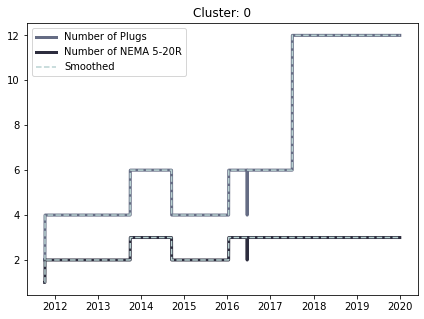

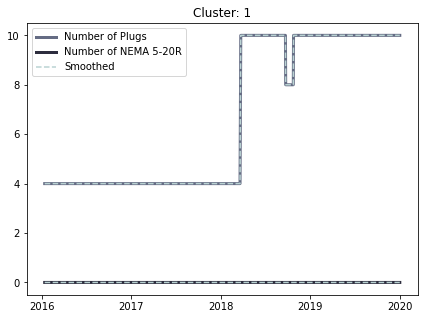

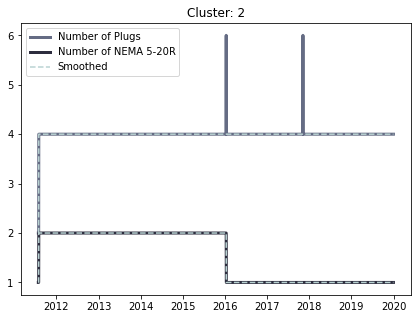

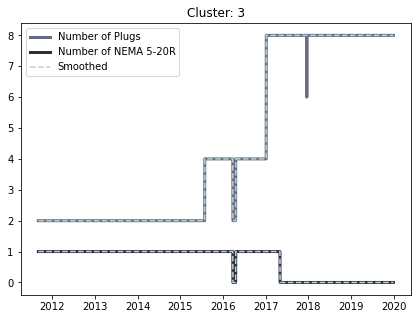

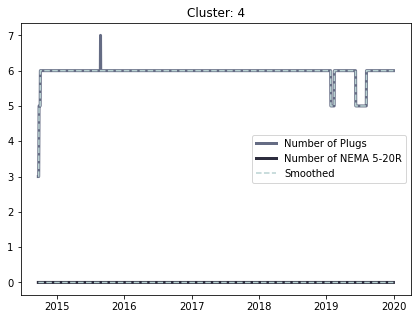

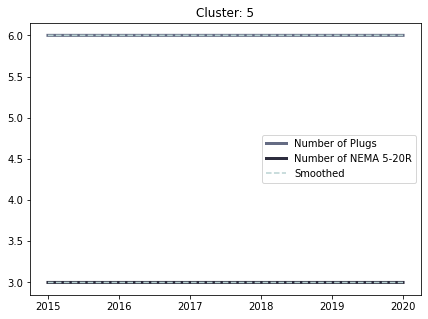

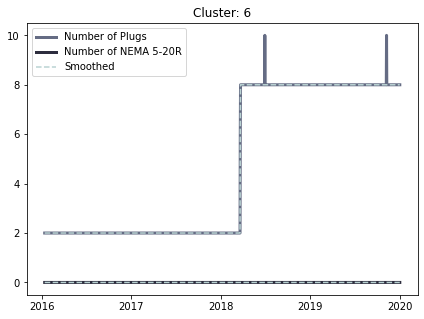

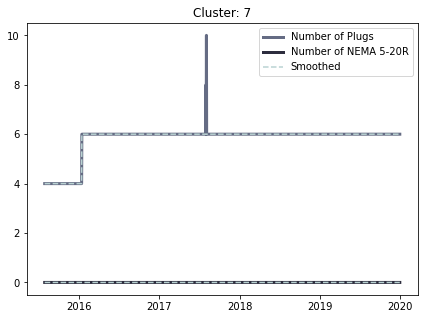

In [64]:
plt.rcParams['figure.figsize'] = [7, 5]
for l in range(len(plugdf['Label'].unique())):
    ax = plt.gca()
    
    
 
    
    ax.xaxis.set_major_locator(matplotlib.dates.YearLocator())
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%Y'))
    
    #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%Y'))


    plt.plot(plugdf[plugdf['Label'] == l].index, plugdf[plugdf['Label'] == l]['Plugs_raw'], lw=3, color = cmap(0.45), label = 'Number of Plugs')
    plt.plot(plugdf[plugdf['Label'] == l].index, plugdf[plugdf['Label'] == l]['Number of NEMA 5-20R_raw'], lw=3, color = cmap(0.2), label = 'Number of NEMA 5-20R')

    
    plt.plot(plugdf[plugdf['Label'] == l].index, plugdf[plugdf['Label'] == l]['Plugs'], '--', color = cmap(0.8), label = 'Smoothed')
    plt.plot(plugdf[plugdf['Label'] == l].index, plugdf[plugdf['Label'] == l]['Number of NEMA 5-20R'], '--', color = cmap(0.8))

    plt.legend()
    plt.title(f"Cluster: {l}")
    plt.show()

#### Another one

In [94]:
plt.rcParams['figure.facecolor'] = 'white'
fig, ax = plt.subplots()
for l in range(len(df_days_with_external['Label'].unique())): 
    ax.plot(df_days_with_external[df_days_with_external['Label']==l].index, df_days_with_external[df_days_with_external['Label']==l]['Plugs']+l/15, lw = 3, label = l)
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.legend()
plt.title('Plugs available at cluster for a given date')
plt.show()

KeyboardInterrupt: 

## The target variable 

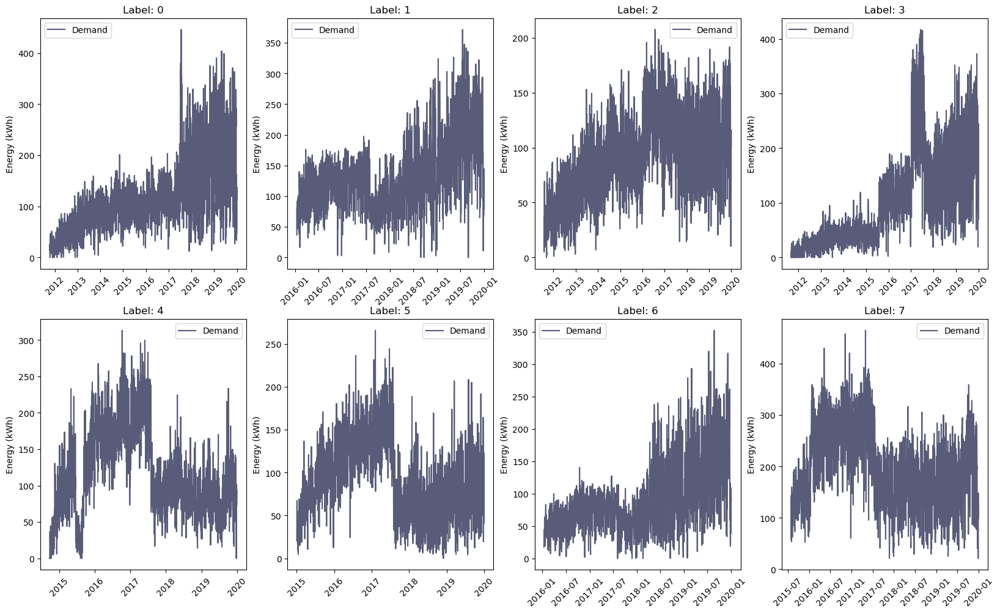

In [274]:
#plt.plot[ww[ww['Label'] == 0]['Energy (kWh)']]
#plt.show()
#la = 5
fig = plt.figure(figsize=(20,25), dpi= 100)
#subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)


for ix, la in enumerate(np.sort((df_days_with_external['Label'].unique()))):
    dfla = df_days_with_external[df_days_with_external['Label'] == la]
    dftemp = dfla[(dfla['Energy (kWh)'] != 0).cumsum() > 0]
    dftemp.index = pd.to_datetime(dftemp.index)
    
    #fig, ax = plt.subplots()
    plt.subplot(4,4,ix+1)
    #xaxis.set_major_locator(matplotlib.dates.YearLocator())
    plt.plot(dftemp.index, dftemp['Energy (kWh)'], zorder=0, color = cmap(0.4), label = 'Demand')
    plt.xticks(rotation=45)
    plt.ylabel('Energy (kWh)')
    plt.legend()

    #ax.set_ylabel('Energy (kWh)')
    #ax.vlines(dftemp[dftemp['Fee (USD)'] != 0].index.min(), ymin = -3, ymax = dftemp['Energy (kWh)'].max(), color = 'red', label="Fee is introduced")
    #
    #ax2 = ax.twinx() 
    #ax2.plot(dftemp.index, dftemp['Plugs'])
    #ax2.plot(dftemp.index, dftemp['Plugs_raw'], color = 'black')
#
    #ax2.plot(dftemp.index, dftemp['Number of NEMA 5-20R'], color = 'yellow')
#
    #ax2.set_ylabel('Nr of Plugs')
    #yint = range(0, math.ceil(max(dftemp['Plugs_raw']))+1) #math.floor(min(dftemp['Plugs']))
    #ax2.set_yticks(yint)
    #
    #plt.title.set_text(f"Cluster {la}")
    #ax2.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    #plt.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%Y'))
    #((ww[ww['Label'] == la]['Energy (kWh)'] - ww[ww['Label'] == la]['Energy (kWh)'].mean())/ ww[ww['Label'] == la]['Energy (kWh)'].std()).plot(label = "Standardized consumption")
    #(ww[ww['Label'] == la]['Plugs']).plot(label = "Nr of plugs")
    #plt.vlines(ww[ww['Fee (USD)'] != 0].index.min(), ymin = -3, ymax = ww[ww['Label'] == la]['Plugs'].max(), color = 'red', label="Fee is introduced")
    plt.title(f"Label: {la}")
    #plt.legend()
    #ax.legend()
plt.show()
fig.savefig('TheTargetVariable.png')

## What drives consumption? 

#### Fees and plugs 

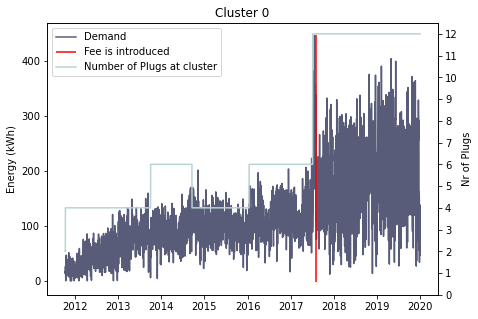

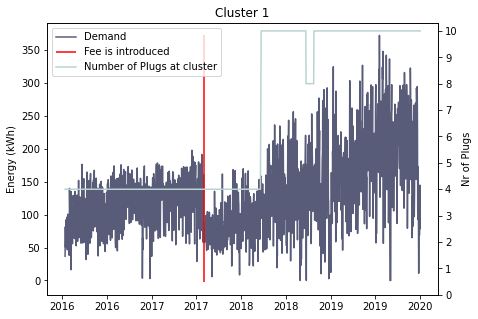

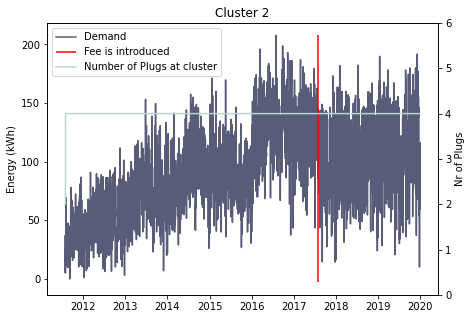

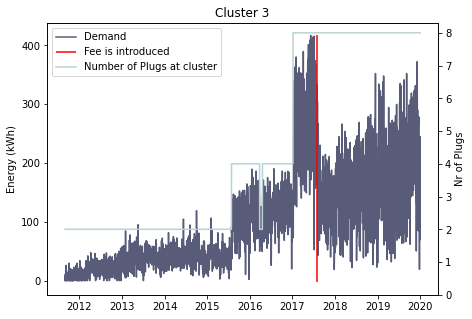

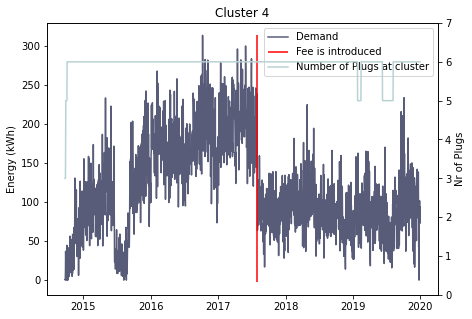

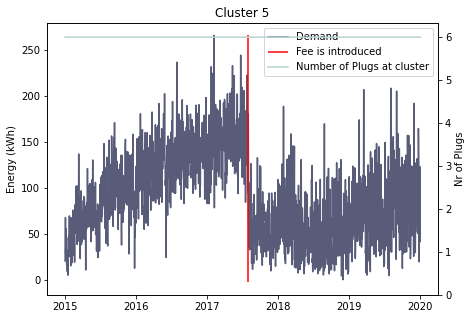

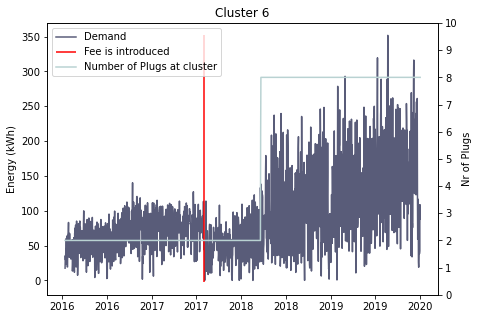

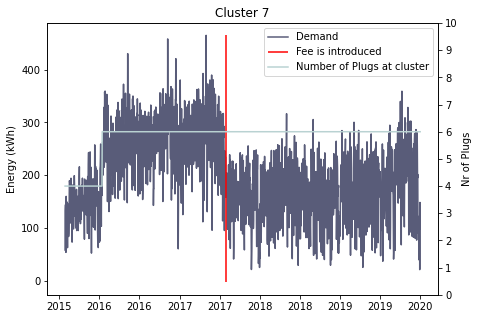

In [273]:
#plt.plot[ww[ww['Label'] == 0]['Energy (kWh)']]
#plt.show()
#la = 5


for la in range(len(df_days_with_external['Label'].unique())):
    dfla = df_days_with_external[df_days_with_external['Label'] == la]
    dftemp = dfla[(dfla['Energy (kWh)'] != 0).cumsum() > 0]
    dftemp.index = pd.to_datetime(dftemp.index)
    
    fig, ax = plt.subplots()
    ax.xaxis.set_major_locator(matplotlib.dates.YearLocator())
    ax.plot(dftemp.index, dftemp['Energy (kWh)'], zorder=0, color = cmap(0.4), label = 'Demand')
    
    ax.set_ylabel('Energy (kWh)')
    ax.vlines(dftemp[dftemp['Fee (USD)'] != 0].index.min(), ymin = -3, ymax = dftemp['Energy (kWh)'].max(), color = 'red', label="Fee is introduced")

    handlesax, labelsax = ax.get_legend_handles_labels()

    
    ax2 = ax.twinx() 
    #ax2.plot(dftemp.index, dftemp['Plugs'])
    ax2.plot(dftemp.index, dftemp['Plugs'], color = cmap(0.8), label = 'Number of Plugs at cluster')

    #ax2.plot(dftemp.index, dftemp['Number of NEMA 5-20R'], color = 'yellow')

    ax2.set_ylabel('Nr of Plugs')
    yint = range(0, math.ceil(max(dftemp['Plugs_raw']))+1) #math.floor(min(dftemp['Plugs']))
    ax2.set_yticks(yint)
    
    ax2.title.set_text(f"Cluster {la}")
    handlesax2, labelsax2 = ax2.get_legend_handles_labels()

    #ax2.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%Y'))
    #((ww[ww['Label'] == la]['Energy (kWh)'] - ww[ww['Label'] == la]['Energy (kWh)'].mean())/ ww[ww['Label'] == la]['Energy (kWh)'].std()).plot(label = "Standardized consumption")
    #(ww[ww['Label'] == la]['Plugs']).plot(label = "Nr of plugs")
    #plt.vlines(ww[ww['Fee (USD)'] != 0].index.min(), ymin = -3, ymax = ww[ww['Label'] == la]['Plugs'].max(), color = 'red', label="Fee is introduced")
    #plt.title(f"Label: {la}")
    #plt.legend()
    handles = handlesax + handlesax2
    labels = labelsax + labelsax2
    
    ax.legend(handles, labels, bbox_to_anchor=(1.05, 1), )
    
    plt.show()

In [98]:
df_days_with_external.columns

Index(['Label', 'Charging Time (mins)', 'Parking Time (mins)', 'Energy (kWh)',
       'Fee (USD)', '# Food', '# Shop & Service',
       '# Professional & Other Places', '# Nightlife Spot',
       '# Outdoors & Recreation', '# Arts & Entertainment',
       '# Travel & Transport', '# College & University', '# Event',
       '# Residence', 'Plugs_raw', 'Number of NEMA 5-20R_raw', 'Plugs',
       'Number of NEMA 5-20R', 'Label_0', 'Label_1', 'Label_2', 'Label_3',
       'Label_4', 'Label_5', 'Label_6', 'Label_7', 'Month_Day_1',
       'Month_Day_2', 'Month_Day_3', 'Month_Day_4', 'Month_Day_5',
       'Month_Day_6', 'Month_Day_7', 'Month_Day_8', 'Month_Day_9',
       'Month_Day_10', 'Month_Day_11', 'Month_Day_12', 'Month_Day_13',
       'Month_Day_14', 'Month_Day_15', 'Month_Day_16', 'Month_Day_17',
       'Month_Day_18', 'Month_Day_19', 'Month_Day_20', 'Month_Day_21',
       'Month_Day_22', 'Month_Day_23', 'Month_Day_24', 'Month_Day_25',
       'Month_Day_26', 'Month_Day_27', 'Month_Day_28

In [100]:
df_days_with_external[df_days_with_external['Holiday'] == 1]

,Label,Charging Time (mins),Parking Time (mins),Energy (kWh),Fee (USD),# Food,# Shop & Service,# Professional & Other Places,# Nightlife Spot,# Outdoors & Recreation,...,Year_Month_6,Year_Month_7,Year_Month_8,Year_Month_9,Year_Month_10,Year_Month_11,Year_Month_12,Holiday,Days_previous_holiday,Days_next_holiday
Date,,,,,,,,,,,,,,,,,,,,,
2011-09-05,2,578.074595,1080.301518,30.645137,0.000000,127.0,99.0,86,87.0,82,...,0,0,0,1,0,0,0,1,0,0
2011-10-10,2,734.366667,980.483333,41.653380,0.000000,127.0,99.0,86,87.0,82,...,0,0,0,0,1,0,0,1,0,0
2011-11-11,2,1214.683333,1243.966667,61.639553,0.000000,127.0,99.0,86,87.0,82,...,0,0,0,0,0,1,0,1,0,0
2011-11-24,2,218.353371,719.594944,10.190603,0.000000,127.0,99.0,86,87.0,82,...,0,0,0,0,0,1,0,1,0,0
2011-12-26,2,520.198326,710.669944,28.756782,0.000000,127.0,99.0,86,87.0,82,...,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-09-02,0,1577.350000,1823.250000,122.628000,30.480000,132.0,105.0,83,69.0,45,...,0,0,0,1,0,0,0,1,0,0
2019-10-14,0,2139.033333,2270.066667,166.683000,38.470000,132.0,105.0,83,69.0,45,...,0,0,0,0,1,0,0,1,0,0
2019-11-11,0,2272.000000,2633.116667,162.144000,45.700000,132.0,105.0,83,69.0,45,...,0,0,0,0,0,1,0,1,0,0


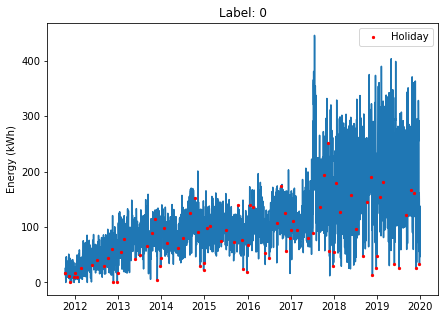

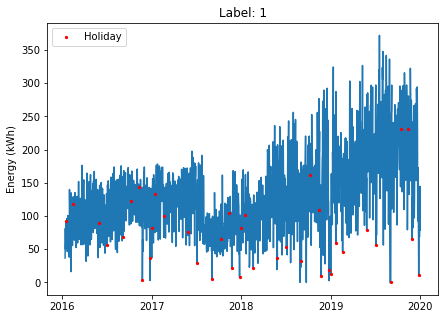

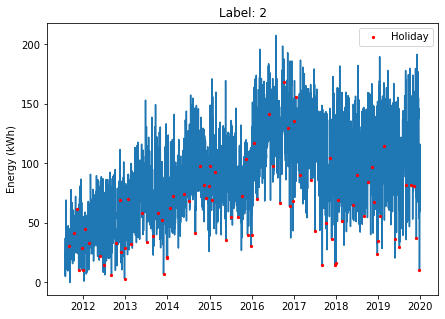

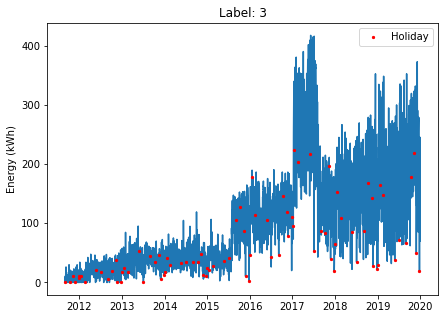

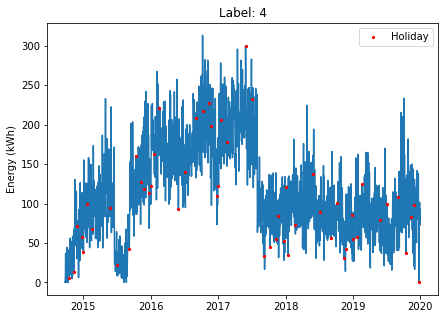

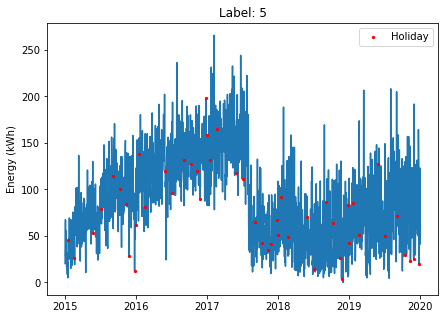

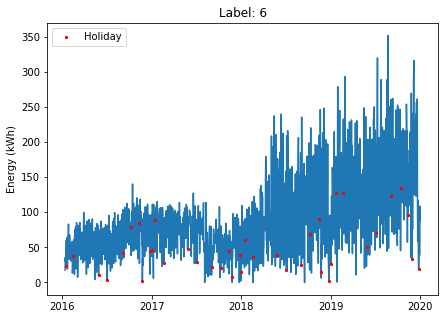

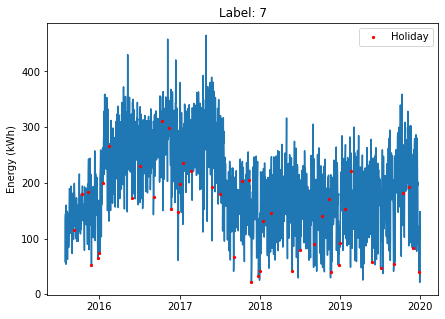

In [114]:
#plt.plot[ww[ww['Label'] == 0]['Energy (kWh)']]
#plt.show()
#la = 5
for la in range(len(df_days_with_external['Label'].unique())):
    dfla = df_days_with_external[df_days_with_external['Label'] == la]
    dftemp = dfla[(dfla['Energy (kWh)'] != 0).cumsum() > 0]
    dftemp.index = pd.to_datetime(dftemp.index)
    
    dftemp = dftemp#.head(100)
    
    close_to = dftemp[(dftemp['Days_previous_holiday'] <= 3) | (dftemp['Days_next_holiday'] <= 3)]#.head(100)
    actual = dftemp[dftemp['Holiday'] == 1]#.head(100)
    fig, ax = plt.subplots()
    ax.xaxis.set_major_locator(matplotlib.dates.YearLocator())
    #ax.scatter(close_to.index, close_to['Energy (kWh)'], zorder=1, color = 'orange')

    ax.scatter(actual.index, actual['Energy (kWh)'], s = 5, zorder=2, color = 'red', label = 'Holiday')
    ax.plot(dftemp.index, dftemp['Energy (kWh)'], zorder=0)


    ax.set_ylabel('Energy (kWh)')
    
    
    
    #ax.vlines(dftemp[dftemp['Fee (USD)'] != 0].index.min(), ymin = -3, ymax = dftemp['Energy (kWh)'].max(), color = 'red', label="Fee is introduced")
   #
   #ax2 = ax.twinx() 
   #ax2.plot(dftemp.index, dftemp['Plugs'])
   #ax2.plot(dftemp.index, dftemp['Plugs_raw'], color = 'black')

   #ax2.plot(dftemp.index, dftemp['Number of NEMA 5-20R'], color = 'yellow')

   #ax2.set_ylabel('Nr of Plugs')
   #yint = range(0, math.ceil(max(dftemp['Plugs_raw']))+1) #math.floor(min(dftemp['Plugs']))
   #ax2.set_yticks(yint)
   #
   #ax2.title.set_text(f"Cluster {la}")
    #ax2.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%Y'))
    #((ww[ww['Label'] == la]['Energy (kWh)'] - ww[ww['Label'] == la]['Energy (kWh)'].mean())/ ww[ww['Label'] == la]['Energy (kWh)'].std()).plot(label = "Standardized consumption")
    #(ww[ww['Label'] == la]['Plugs']).plot(label = "Nr of plugs")
    #plt.vlines(ww[ww['Fee (USD)'] != 0].index.min(), ymin = -3, ymax = ww[ww['Label'] == la]['Plugs'].max(), color = 'red', label="Fee is introduced")
    plt.title(f"Label: {la}")
    #plt.legend()
    ax.legend()
    plt.show()